# Introduction

In the [first part](https://maxworgan.github.io/blog/dimension%20reduction/auto-encoder/swarm/2022/01/14/DCAE-Part-1.html) I reimplemented the convolutional auto encoder from TimeCluster by [Ali et al](http://cs.swan.ac.uk/~csmark/publications/2019_TimeCluster.html).
The the [second part](https://maxworgan.github.io/blog/dimension%20reduction/auto-encoder/swarm/2022/02/06/DCAE_Part_2.html), I adapted the model to handle all 300 flock agents.

In this notebook I evaluate serveral processes to turn the latent space representation into parameters for musical control

In [1]:
#| include: false
#using Pkg;
#Pkg.update()

In [3]:
#| include: false
using Flux, CSV, DataFrames, StatsBase,MLDataPattern, CUDA, PlotlyJS, LegolasFlux, UMAP, MultivariateStats,TSne, Plots, ManifoldLearning

WebIO._IJuliaInit()

In [4]:
#| include: false
#load the data
df = DataFrame(CSV.File("data_3.csv"; header=false, types=Float32))

,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32
1,265.016,-92.8037,-38.0635,36.4608,117.116,248.638,-293.46,-105.428,83.4998
2,264.227,-95.1109,-41.1452,37.581,115.349,247.427,-292.218,-104.078,84.5678
3,263.411,-97.4066,-44.2264,38.6952,113.586,246.204,-290.967,-102.731,85.629
4,262.568,-99.6902,-47.3071,39.8027,111.823,244.975,-289.706,-101.388,86.6834
5,261.698,-101.96,-50.3869,40.9041,110.061,243.74,-288.437,-100.048,87.7312
6,260.808,-104.212,-53.4544,41.9991,108.298,242.5,-287.158,-98.7106,88.7723
7,259.9,-106.444,-56.5101,43.0754,106.529,241.251,-285.871,-97.3769,89.8069
8,258.973,-108.655,-59.5558,44.129,104.753,239.994,-284.576,-96.0464,90.8352
9,258.027,-110.857,-62.596,45.1645,102.969,238.734,-283.272,-94.719,91.8571


In [5]:
function normalise(M) 
    min = minimum(minimum(eachcol(M)))
    max = maximum(maximum(eachcol(M)))
    return (M .- min) ./ (max - min)
end

normalised = Array(df) |> normalise

window_size = 60

data = slidingwindow(normalised',window_size,stride=1)

train, validate, test = splitobs(shuffleobs(data), (0.7,0.2));

In [6]:
function create_ae_1d()
  # Define the encoder and decoder networks 
  encoder = Chain(
  # 60x900xb
  Conv((9,), 900 => 9000, relu; pad = SamePad()),
  MaxPool((2,)),
  # 30x9000xb
  Conv((5,), 9000 => 4500, relu; pad = SamePad()),
  MaxPool((2,)),
  # 15x4500xb
  Conv((5,),4500 => 2250, relu; pad = SamePad()),
  # 15x2250xb
  MaxPool((3,)),
  Conv((3,),2250 => 1000, relu; pad = SamePad()),
  Conv((3,),1000 => 100, relu; pad = SamePad()),
  # 5x100xb
  Flux.flatten,
  Dense(500,100)
)
decoder = Chain(
  Dense(100,500),
  (x -> reshape(x, 5,100,:)),
  # 5x100xb
  ConvTranspose((3,), 100  => 1000, relu; pad = SamePad()),
  ConvTranspose((3,), 1000 => 2250, relu; pad = SamePad()),
  Upsample((3,)),
  # 15x2250xb
  ConvTranspose((5,), 2250 => 4500, relu; pad = SamePad()),
  Upsample((2,)),
  # 30x4500xb
  ConvTranspose((5,), 4500 => 9000, relu; pad = SamePad()),
  Upsample((2,)),
  # 60x9000xb
  ConvTranspose((9,), 9000 => 900, relu; pad = SamePad()),
  # 60x900xb
)
return (encoder, decoder)
end

create_ae_1d (generic function with 1 method)

### Load saved model

We load the saved model that we trained in the previous step


In [7]:
encoder, decoder  = create_ae_1d()
new_model         = Chain(encoder, decoder)
model_row         = read_model_row("1d_300_model-112-8.0e-6.arrow")
load_weights!(new_model, model_row.weights)

In [8]:
@userplot FlockPlot
@recipe function f(cp::FlockPlot)
    x,y,z = cp.args
    color := :black
    label --> false
    seriestype := :scatter
    alpha := 0.75
    markersize := 3
    xlim := (0, 1)
    ylim := (0, 1)
    zlim := (0, 1)
    x, y, z
end

function create_gif_of_data_latent_space_and_reduced(data, encoded, components, title)
    s = size(components,1)
    t = reshape(getobs(data), 3, 300, s)
    t = permutedims(t, [2,3,1])
    anim = @animate for i ∈ 1:s
        A = flockplot(t[:,i,1], t[:,i,2], t[:,i,3],  title = "Input Swarm")
        B = Plots.bar(components[i], title=title, label=""; ylim=(-35,35))
        C = Plots.heatmap(reshape(encoded[i], (10,10)),colorbar=false, color=:autumn, title="Encoded Representation", axis=([], false))
        Plots.plot(A,C,B;layout=(1,3),size = (1100, 400))
    end
    gif(anim, "anim_fps30.gif", fps=30)
end
    

create_gif_of_data_latent_space_and_PCA (generic function with 1 method)

## Latent space to parameters

Now that we can encode the movement of the whole swarm over 60 timesteps into 100 variables, I want to reduce that encoding even further into ~10 parameters that can be used to sonify the dynamics.

Since we've already used a non linear dimension reduction on our data, lets evaluate PCA, ISOMAP, UMAP to reduce the latent space further.

In [9]:
# Gather all our encoded data into training and test matricies

train_encoded = Matrix{Float32}[]
for t ∈ train
    i      = Flux.unsqueeze(t', 3)
    output = hcat(new_model[1](i)...)
    push!(train_encoded, output)
end

test_encoded = Matrix{Float32}[]
for t ∈ test
    i      = Flux.unsqueeze(t', 3)
    output = hcat(new_model[1](i)...)
    push!(test_encoded, output)
end

### PCA


In [10]:
M = fit(PCA, vcat(train_encoded...)'; maxoutdim=10)

PCA(indim = 100, outdim = 7, principalratio = 0.9925308)

In [11]:
varience_preserved = principalratio(M)

0.9925308f0

In [12]:
contributions_of_components = (principalvars(M) ./ tvar(M) * 100)

7-element Vector{Float32}:
 43.02717
 37.324966
 15.405006
  1.8183522
  0.8683387
  0.46416324
  0.34509116

In [13]:
# grab a few consecutive windows of data, encode and plot the data, the latent space and the principal components
components = Matrix{Float32}[]
encoded = Matrix{Float32}[]

start_index = 101

d = hcat(data[start_index],data[start_index+window_size], data[start_index+(window_size*2)], data[start_index+(window_size*3)])
for i ∈ 0:239
    t = data[start_index + i]
    encoded_t = new_model[1](Flux.unsqueeze(t',3))
    push!(encoded, encoded_t)
    push!(components,MultivariateStats.transform(M, encoded_t))
end

┌ Info: Saved animation to 
│   fn = /notebooks/anim_fps30.gif
└ @ Plots /opt/julia/packages/Plots/LI4FE/src/animation.jl:114


Plots.AnimatedGif("/notebooks/anim_fps30.gif")
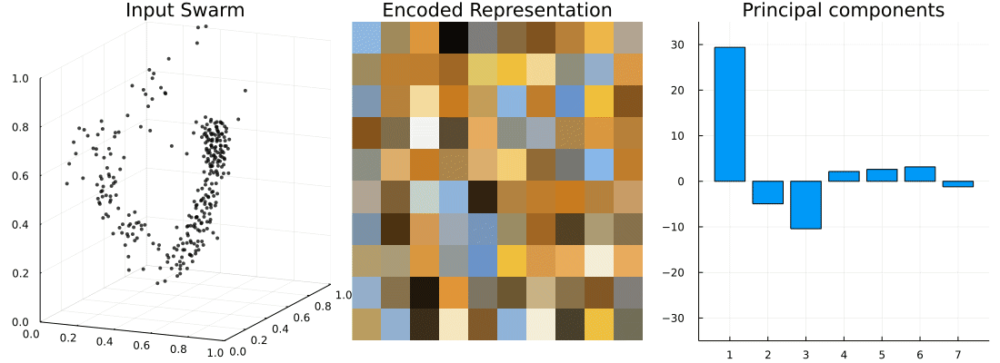

In [14]:
create_gif_of_data_latent_space_and_reduced(d, encoded,components, "Principal components")

#### Notes
Since our method is windowed, a particular encoded representation and a particular set of PCA values actually represents a full window (60 frames / 2 seconds). In order to make the above, I calculated the encoding and the PCA projection for each window, using a step size of one (as was used in the training). So in fact the above is somewhat out of sync, since the encoded and PCA projections are 1 second in front of the raw data, and in fact referencing some data that isn't visable in the Input Swarm visualisation.

### ISOMAP

The implementation of ISOMAP found in ManifoldLearning.jl is unusual for manifold learning algorithms because we can transform out of sample data into an existing model.

In [287]:
M = fit(Isomap, (vcat(train_encoded...) |> f64)')

Isomap{BruteForce}(indim = 100, outdim = 2, neighbors = 12)

In [288]:
Y = ManifoldLearning.transform(M)

2×1749 Matrix{Float64}:
 35.7851    -186.37      206.575     …  -60.2106    -72.1667     -37.1274
 -0.134194     0.145393    0.175012      -0.123771   -0.0541171   -0.130726

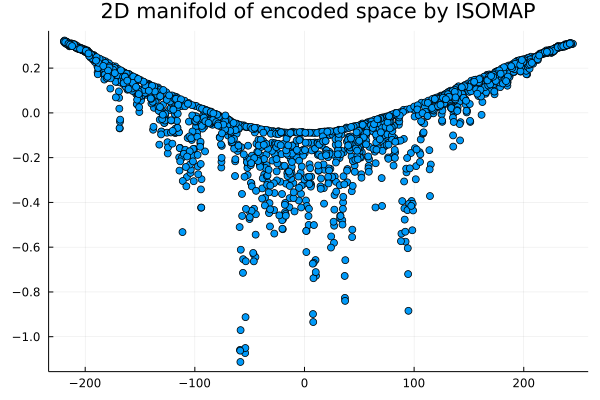

In [289]:
Plots.scatter(T[1,:],T[2,:];label="", title="2D manifold of encoded space by ISOMAP")

In [284]:
# Grab some data form the encoded test set
e = rand(test_encoded)' |> f64;

In [293]:
# Transform the out-of-sample test data into the existing ISOMAP model
@time new_data = predict(M,e);

  0.048351 seconds (15.30 k allocations: 25.509 MiB, 66.18% gc time)


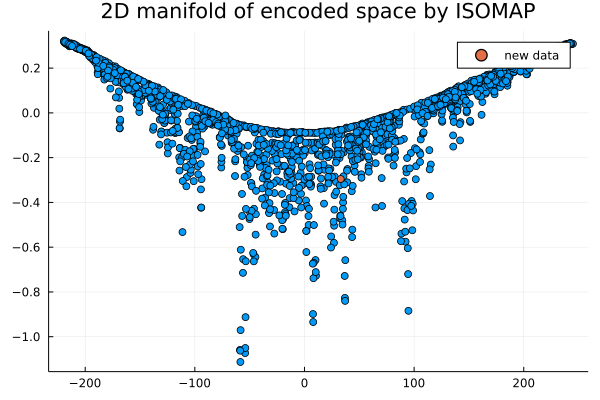

In [294]:
# Overlay the new data onto the existing 2D model
Plots.scatter!([new_data[1]], [new_data[2]], label="new data")

I'm interested in reducing to more than 2 dimensions so lets try with 7 in line with the PCA example above

In [295]:
M7 = fit(Isomap, (vcat(train_encoded...) |> f64)';maxoutdim=7)

Isomap{BruteForce}(indim = 100, outdim = 7, neighbors = 12)

In [299]:
isomap = Matrix{Float32}[]
encoded = Matrix{Float32}[]

start_index = 101

d = hcat(data[start_index],data[start_index+window_size], data[start_index+(window_size*2)], data[start_index+(window_size*3)])
for i ∈ 0:239
    t = data[start_index + i]
    encoded_t = new_model[1](Flux.unsqueeze(t',3)) |> f64
    push!(encoded, encoded_t)
    push!(isomap,predict(M7, encoded_t))
end

┌ Info: Saved animation to 
│   fn = /notebooks/anim_fps30.gif
└ @ Plots /opt/julia/packages/Plots/LI4FE/src/animation.jl:114


Plots.AnimatedGif("/notebooks/anim_fps30.gif")
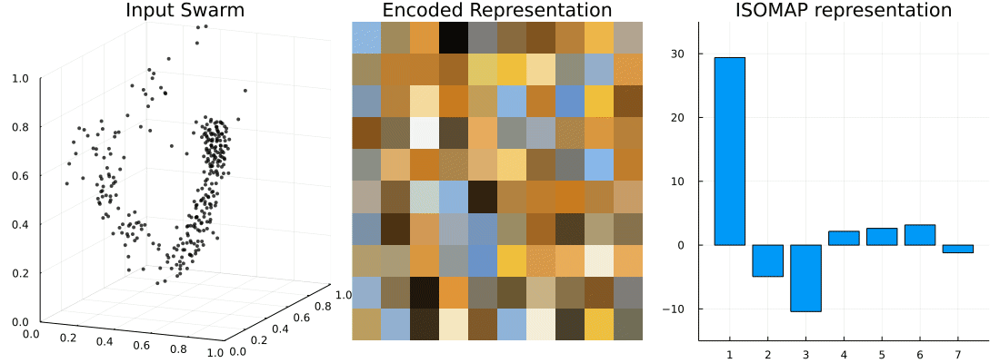

In [302]:
create_gif_of_data_latent_space_and_reduced(d, encoded,components, "ISOMAP representation")

### UMAP

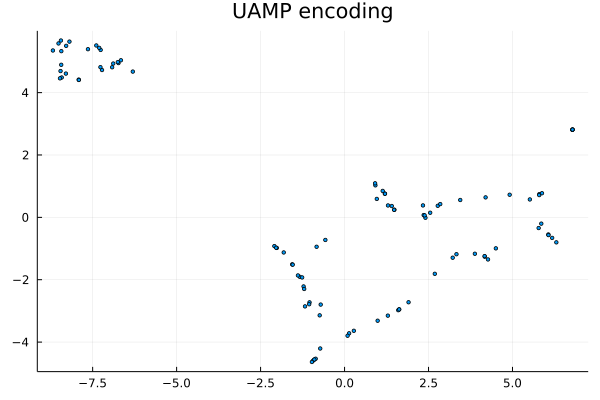

In [314]:
# use UMAP to do additional encoding on the latent space
# unfortunatly there is no easy way to do out-of-sample transformation

res_jl = umap(vcat(train_encoded...); n_neighbors=5, min_dist=0.001, n_epochs=100)
Plots.scatter(res_jl[1,:], res_jl[2,:], title="UAMP encoding", marker=(2, 2, :auto), label="")

Interesting to see some clusters emerge in the 2D representation. Could this be used for behaviour classification? Without out-of-sample data prediction, it's not going to be useful in the context I want to use it.